# Fine-tuning an Object detection model with TensorFlow Model Garden

## Install dependencies

Install a version of `tf-models-official` that is compatible with tensorflow, cuDNN and CUDA. Check [tested build configurations](https://www.tensorflow.org/install/source#gpu).

In [1]:
!python --version

Python 3.9.13


In [2]:
import tensorflow as tf
print(tf.__version__)
print(tf.config.list_physical_devices())

2024-01-21 17:11:34.269698: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


2.9.1
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


2024-01-21 17:11:40.365847: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-21 17:11:40.371821: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-21 17:11:40.372434: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [3]:
!nvidia-smi

Sun Jan 21 17:11:40 2024       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.182.03   Driver Version: 470.182.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            On   | 00000000:00:1E.0 Off |                    0 |
| N/A   22C    P8     9W /  70W |      3MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!conda list
# cudnn        8.1.0.77 
# cudatoolkit  11.2.2
# tensorflow   2.9.1 

In [5]:
!pip install --upgrade pip

  Using cached pip-23.3.2-py3-none-any.whl (2.1 MB)
  Attempting uninstall: pip
    Found existing installation: pip 22.2.2
    Uninstalling pip-22.2.2:
      Successfully uninstalled pip-22.2.2


In [6]:
!pip install -q tf-models-official==2.9.1

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.55.2 requires numpy<1.23,>=1.18, but you have numpy 1.26.3 which is incompatible.


Restart kernel

### Check TensorFlow installation

In [1]:
import tensorflow as tf
print(tf.__version__)
print(tf.config.list_physical_devices())

2024-01-21 17:13:16.089508: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


2.9.1
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


2024-01-21 17:13:18.161714: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-21 17:13:18.169211: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-21 17:13:18.169800: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [2]:
!python3 -c "import tensorflow as tf; print(tf.reduce_sum(tf.random.normal([1000, 1000])))"

2024-01-21 17:13:18.874265: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-01-21 17:13:20.737228: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-21 17:13:20.743899: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-21 17:13:20.744549: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-21 17:13:20.745368: I tensorflow/core/

In [3]:
!python3 -c "import tensorflow as tf; print(tf.config.list_physical_devices('GPU'))"

2024-01-21 17:13:22.873573: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-01-21 17:13:24.769326: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-21 17:13:24.775947: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-21 17:13:24.776557: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
[PhysicalDevice(name='/physical_device:GPU:0',

## Import required libraries

In [4]:
import os
import io
import pprint
import tempfile
import matplotlib
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from PIL import Image
from six import BytesIO
from IPython import display
from urllib.request import urlopen

In [5]:
# Import required libraries from tensorflow models
import orbit
import tensorflow_models as tfm

from official.core import exp_factory
from official.core import config_definitions as cfg
from official.vision.serving import export_saved_model_lib
from official.vision.ops.preprocess_ops import normalize_image
from official.vision.ops.preprocess_ops import resize_and_crop_image
from official.vision.utils.object_detection import visualization_utils
from official.vision.dataloaders.tf_example_decoder import TfExampleDecoder

pp = pprint.PrettyPrinter(indent=4) # Set Pretty Print Indentation
print(tf.__version__) # Check the version of tensorflow used

%matplotlib inline

/opt/saturncloud/envs/saturn/lib/python3.9/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/opt/saturncloud/envs/saturn/lib/python3.9/site-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.13.0 and strictly below 2.16.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.9.1 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.


2.9.1


## Load dataset

Run the `tf_kangaroo_dataset.ipynb` to get a compressed folder (`dataset.zip`) containing the TFRecords ( `train.record` and `test.record`) for model training and testing.

In [ ]:
!unzip ./dataset.zip

### Explore the TFRecords

In [6]:
import IPython.display as display

In [7]:
filename = './dataset/train.record'

In [8]:
filenames = [filename]
raw_dataset = tf.data.TFRecordDataset(filenames)
raw_dataset

2024-01-21 17:14:15.438056: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-21 17:14:15.438491: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-21 17:14:15.439161: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-21 17:14:15.439697: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so ret

<TFRecordDatasetV2 element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>

In [9]:
for raw_record in raw_dataset.take(1):
  example = tf.train.Example()
  example.ParseFromString(raw_record.numpy())
  print(example)

features {
  feature {
    key: "image/encoded"
    value {
      bytes_list {
        value: "\377\330\377\340\000\020JFIF\000\001\001\001\000`\000`\000\000\377\333\000C\000\006\004\005\006\005\004\006\006\005\006\007\007\006\010\n\020\n\n\t\t\n\024\016\017\014\020\027\024\030\030\027\024\026\026\032\035%\037\032\033#\034\026\026 , #&\')*)\031\037-0-(0%()(\377\333\000C\001\007\007\007\n\010\n\023\n\n\023(\032\026\032((((((((((((((((((((((((((((((((((((((((((((((((((\377\300\000\021\010\002@\004\000\003\001\"\000\002\021\001\003\021\001\377\304\000\034\000\000\003\000\003\001\001\001\000\000\000\000\000\000\000\000\000\003\004\005\001\002\006\000\007\010\377\304\000?\020\000\002\001\003\003\003\003\004\000\004\006\001\003\004\000\007\001\002\003\000\004\021\005\022!\0231A\"Qa\006\0242q#B\201\221\007\025R\241\301\321\261$3bCr\341\360%\361\0264\027Sc\377\304\000\032\001\000\003\001\001\001\001\000\000\000\000\000\000\000\000\000\000\001\002\003\000\004\005\006\377\304\000(\021\000\002\00

In [10]:
result = {}
# example.features.feature is the dictionary
for key, feature in example.features.feature.items():
  # The values are the Feature objects which contain a `kind` which contains:
  # one of three fields: bytes_list, float_list, int64_list

  kind = feature.WhichOneof('kind')
  result[key] = np.array(getattr(feature, kind).value)

result

{'image/object/bbox/xmax': array([0.86230469]),
 'image/object/class/label': array([1]),
 'image/height': array([576]),
 'image/source_id': array([b'0'], dtype='|S1'),
 'image/object/bbox/xmin': array([0.23046875]),
 'image/object/class/text': array([b'kangaroo'], dtype='|S8'),
 'image/filename': array([b'kangaroo-10.jpg'], dtype='|S15'),
 'image/object/bbox/ymin': array([0.01041667]),
 'image/format': array([b'jpg'], dtype='|S3'),
 'image/object/bbox/ymax': array([1.]),
 'image/encoded': array([b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00`\x00`\x00\x00\xff\xdb\x00C\x00\x06\x04\x05\x06\x05\x04\x06\x06\x05\x06\x07\x07\x06\x08\n\x10\n\n\t\t\n\x14\x0e\x0f\x0c\x10\x17\x14\x18\x18\x17\x14\x16\x16\x1a\x1d%\x1f\x1a\x1b#\x1c\x16\x16 , #&\')*)\x19\x1f-0-(0%()(\xff\xdb\x00C\x01\x07\x07\x07\n\x08\n\x13\n\n\x13(\x1a\x16\x1a((((((((((((((((((((((((((((((((((((((((((((((((((\xff\xc0\x00\x11\x08\x02@\x04\x00\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1c\x00\x00\x03\x00\x03\x01\x01\x01\x0

In [11]:
!du -sh ./dataset/train.record

63M	./dataset/train.record


In [12]:
import tensorflow as tf

def count_records(tfrecord_file):
    count = 0
    for record in tf.data.TFRecordDataset(tfrecord_file):
        count += 1
    return count

train_record_file = './dataset/train.record'
test_record_file = './dataset/test.record'
num_train_images = count_records(train_record_file)
num_test_images = count_records(test_record_file)

print(f'Number of images in {train_record_file}: {num_train_images}')
print(f'Number of images in {test_record_file}: {num_test_images}')


Number of images in ./dataset/train.record: 263
Number of images in ./dataset/test.record: 89


In [13]:
raw_image_dataset = tf.data.TFRecordDataset('./dataset/train.record')

# Create a dictionary describing the features.
image_feature_description = {
    'image/encoded': tf.io.FixedLenFeature([], tf.string),
    'image/height': tf.io.FixedLenFeature([], tf.int64),
    'image/width': tf.io.FixedLenFeature([], tf.int64),
    'image/format': tf.io.FixedLenFeature([], tf.string),
    'image/source_id': tf.io.FixedLenFeature([], tf.string),
}

def _parse_image_function(example_proto):
  return tf.io.parse_single_example(example_proto, image_feature_description)

parsed_image_dataset = raw_image_dataset.map(_parse_image_function)
parsed_image_dataset

<MapDataset element_spec={'image/encoded': TensorSpec(shape=(), dtype=tf.string, name=None), 'image/format': TensorSpec(shape=(), dtype=tf.string, name=None), 'image/height': TensorSpec(shape=(), dtype=tf.int64, name=None), 'image/source_id': TensorSpec(shape=(), dtype=tf.string, name=None), 'image/width': TensorSpec(shape=(), dtype=tf.int64, name=None)}>

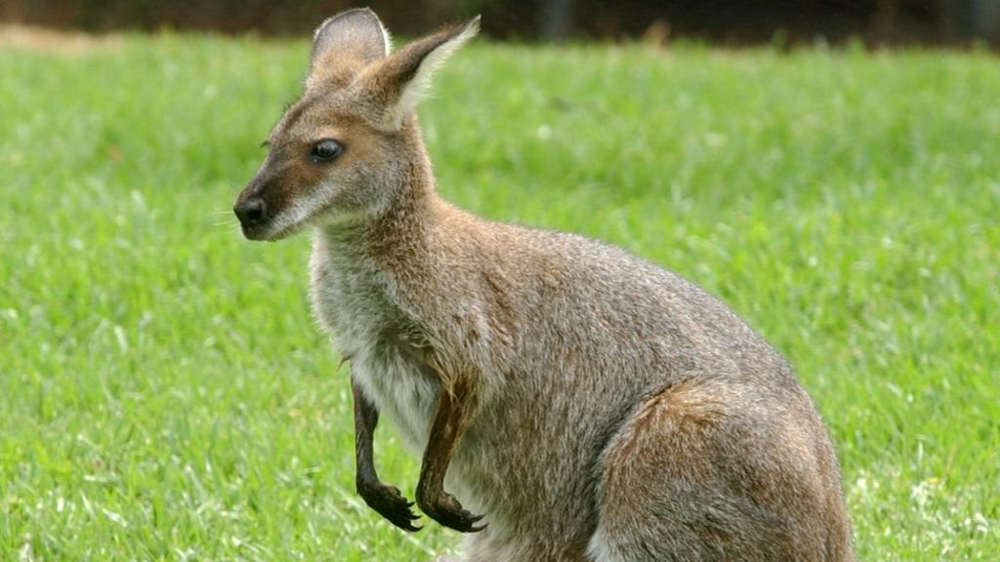

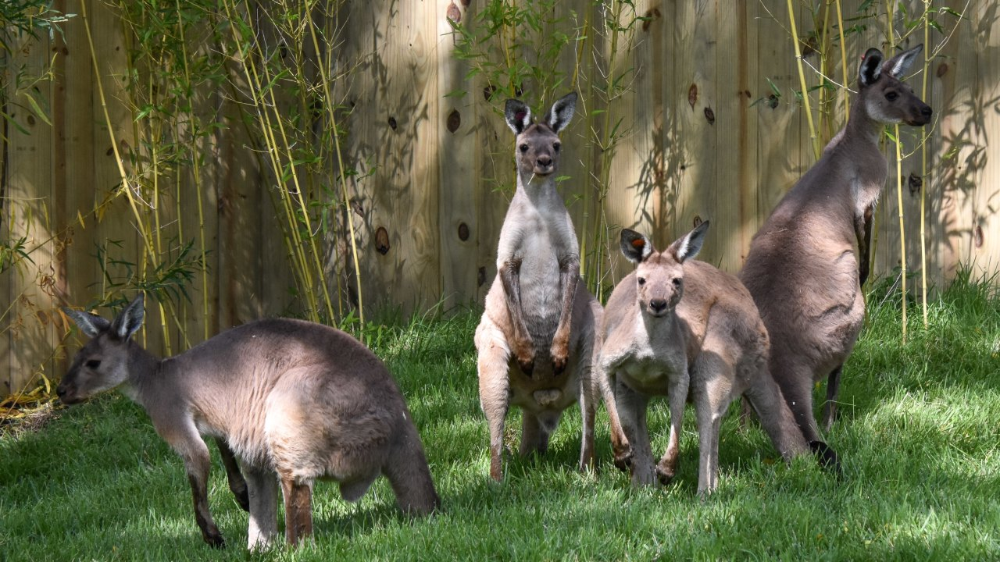

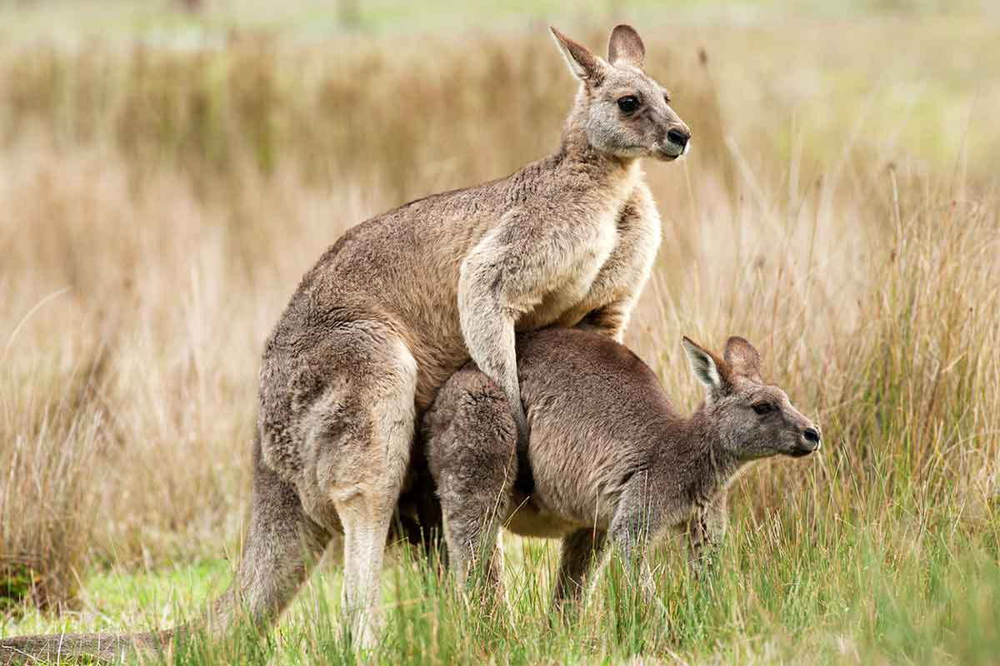

In [14]:
for image_features in parsed_image_dataset.take(3):
  image_raw = image_features['image/encoded'].numpy()
  display.display(display.Image(data=image_raw, height=256, width=256))

## Configure the Retinanet Resnet FPN COCO model for custom dataset.

In [17]:
train_data_input_path = './dataset/train.record'
valid_data_input_path = './dataset/test.record'
test_data_input_path = './dataset/test.record'
model_dir = './trained_model/'
export_dir ='./exported_model/'

In Model Garden, the collections of parameters that define a model are called *configs*. Model Garden can create a config based on a known set of parameters via a [factory](https://en.wikipedia.org/wiki/Factory_method_pattern).


Use the `retinanet_resnetfpn_coco` experiment configuration, as defined by `tfm.vision.configs.retinanet.retinanet_resnetfpn_coco`.

The configuration defines an experiment to train a RetinanNet with Resnet-50 as backbone, FPN as decoder. Default Configuration is trained on [COCO](https://cocodataset.org/) train2017 and evaluated on [COCO](https://cocodataset.org/) val2017.

There are also other alternative experiments available such as
`retinanet_resnetfpn_coco`, `retinanet_spinenet_coco`, `fasterrcnn_resnetfpn_coco` and more. One can switch to them by changing the experiment name argument to the `get_exp_config` function.

We are going to fine tune the Resnet-50 backbone checkpoint which is already present in the default configuration.

Source: https://www.tensorflow.org/tfmodels/vision/object_detection

In [18]:
exp_config = exp_factory.get_exp_config('retinanet_resnetfpn_coco')

### Adjust the model and dataset configurations so that it works with custom dataset

In [19]:
batch_size = 8
num_classes = 1

HEIGHT, WIDTH = 256, 256
IMG_SIZE = [HEIGHT, WIDTH, 3]

# Backbone config.
exp_config.task.freeze_backbone = False
exp_config.task.annotation_file = ''

# Model config.
exp_config.task.model.input_size = IMG_SIZE
exp_config.task.model.num_classes = num_classes + 1
exp_config.task.model.detection_generator.tflite_post_processing.max_classes_per_detection = exp_config.task.model.num_classes

# Training data config.
exp_config.task.train_data.input_path = train_data_input_path
exp_config.task.train_data.dtype = 'float32'
exp_config.task.train_data.global_batch_size = batch_size
exp_config.task.train_data.parser.aug_scale_max = 1.0
exp_config.task.train_data.parser.aug_scale_min = 1.0

# Validation data config.
exp_config.task.validation_data.input_path = valid_data_input_path
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.global_batch_size = batch_size

### Adjust the trainer configuration.

In [104]:
logical_device_names = [logical_device.name for logical_device in tf.config.list_logical_devices()]

if 'GPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'GPU'
elif 'TPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'TPU'
else:
  print('Running on CPU is slow, so only train for a few steps.')
  device = 'CPU'


NUM_TRAIN_EXAMPLES = 263
NUM_VAL_EXAMPLES = 89

epochs = 20

steps_per_epoch = NUM_TRAIN_EXAMPLES // batch_size
validation_steps = NUM_VAL_EXAMPLES // batch_size

train_steps = steps_per_epoch * epochs

warmup_steps = int(0.1 * train_steps)
initial_learning_rate = 0.001
warmup_learning_rate = 0.5 * initial_learning_rate

exp_config.trainer.steps_per_loop = steps_per_epoch # steps_per_loop = num_of_training_examples // train_batch_size

exp_config.trainer.summary_interval = steps_per_epoch
exp_config.trainer.checkpoint_interval = steps_per_epoch
exp_config.trainer.validation_interval = steps_per_epoch
exp_config.trainer.validation_steps = validation_steps # validation_steps = num_of_validation_examples // eval_batch_size
exp_config.trainer.train_steps = train_steps
exp_config.trainer.optimizer_config.warmup.linear.warmup_steps = warmup_steps #33 #100
exp_config.trainer.optimizer_config.learning_rate.type = 'cosine'
exp_config.trainer.optimizer_config.learning_rate.cosine.decay_steps = train_steps
exp_config.trainer.optimizer_config.learning_rate.cosine.initial_learning_rate = initial_learning_rate
exp_config.trainer.optimizer_config.warmup.linear.warmup_learning_rate = warmup_learning_rate

This may be broken in Colab.


### Print the modified configuration.

In [106]:
pp.pprint(exp_config.as_dict())
display.Javascript('google.colab.output.setIframeHeight("500px");')

{   'runtime': {   'all_reduce_alg': None,
                   'batchnorm_spatial_persistent': False,
                   'dataset_num_private_threads': None,
                   'default_shard_dim': -1,
                   'distribution_strategy': 'mirrored',
                   'enable_xla': False,
                   'gpu_thread_mode': None,
                   'loss_scale': None,
                   'mixed_precision_dtype': 'bfloat16',
                   'num_cores_per_replica': 1,
                   'num_gpus': 0,
                   'num_packs': 1,
                   'per_gpu_thread_count': 0,
                   'run_eagerly': False,
                   'task_index': -1,
                   'tpu': None,
                   'tpu_enable_xla_dynamic_padder': None,
                   'worker_hosts': None},
    'task': {   'annotation_file': '',
                'differential_privacy_config': None,
                'export_config': {   'cast_detection_classes_to_float': False,
                     

<IPython.core.display.Javascript object>

### Set up the distribution strategy.

In [107]:
if exp_config.runtime.mixed_precision_dtype == tf.float16:
    tf.keras.mixed_precision.set_global_policy('mixed_float16')

if 'GPU' in ''.join(logical_device_names):
  distribution_strategy = tf.distribute.MirroredStrategy()
elif 'TPU' in ''.join(logical_device_names):
  tf.tpu.experimental.initialize_tpu_system()
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='/device:TPU_SYSTEM:0')
  distribution_strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
  print('Warning: this will be really slow.')
  distribution_strategy = tf.distribute.OneDeviceStrategy(logical_device_names[0])

print('Done')

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


Done


## Create the `Task` object (`tfm.core.base_task.Task`) from the `config_definitions.TaskConfig`.

The `Task` object has all the methods necessary for building the dataset, building the model, and running training & evaluation. These methods are driven by `tfm.core.train_lib.run_experiment`.

In [108]:
with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

## Visualize a batch of the data.

In [109]:
for images, labels in task.build_inputs(exp_config.task.train_data).take(1):
  print()
  print(f'images.shape: {str(images.shape):16}  images.dtype: {images.dtype!r}')
  print(f'labels.keys: {labels.keys()}')


images.shape: (8, 256, 256, 3)  images.dtype: tf.float32
labels.keys: dict_keys(['cls_targets', 'box_targets', 'anchor_boxes', 'cls_weights', 'box_weights', 'image_info'])


### Create category index dictionary to map the labels to coressponding label names.

In [110]:
category_index={
    1: {
        'id': 1,
        'name': 'kangaroo'
       },
}
tf_ex_decoder = TfExampleDecoder()

### Helper function for visualizing the results from TFRecords.
Use `visualize_boxes_and_labels_on_image_array` from `visualization_utils` to draw boudning boxes on the image.

In [111]:
def show_batch(raw_records, num_of_examples):
  plt.figure(figsize=(20, 20))
  use_normalized_coordinates=True
  min_score_thresh = 0.30
  for i, serialized_example in enumerate(raw_records):
    plt.subplot(1, 3, i + 1)
    decoded_tensors = tf_ex_decoder.decode(serialized_example)
    image = decoded_tensors['image'].numpy().astype('uint8')
    scores = np.ones(shape=(len(decoded_tensors['groundtruth_boxes'])))
    visualization_utils.visualize_boxes_and_labels_on_image_array(
        image,
        decoded_tensors['groundtruth_boxes'].numpy(),
        decoded_tensors['groundtruth_classes'].numpy().astype('int'),
        scores,
        category_index=category_index,
        use_normalized_coordinates=use_normalized_coordinates,
        max_boxes_to_draw=200,
        min_score_thresh=min_score_thresh,
        agnostic_mode=False,
        instance_masks=None,
        line_thickness=4)

    plt.imshow(image)
    plt.axis('off')
    plt.title(f'Image-{i+1}')
  plt.show()

### Visualization of train data

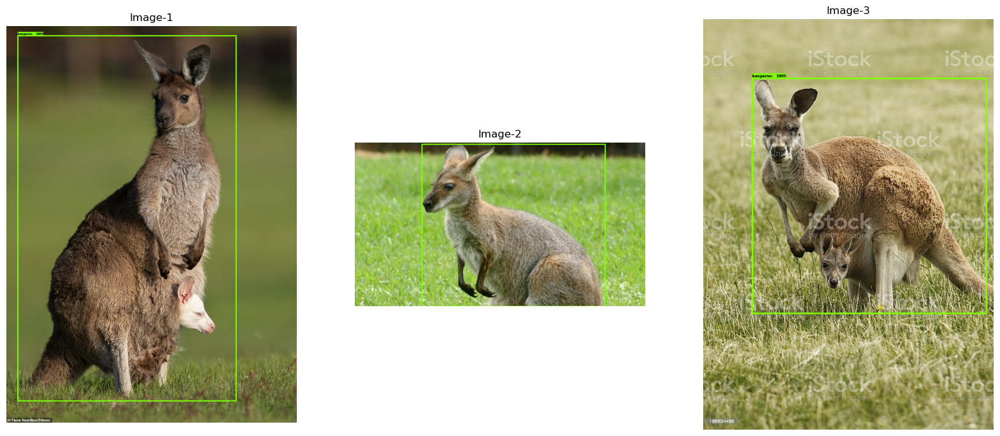

In [31]:
buffer_size = 10
num_of_examples = 3

raw_records = tf.data.TFRecordDataset(
    exp_config.task.train_data.input_path).shuffle(
        buffer_size=buffer_size).take(num_of_examples)
show_batch(raw_records, num_of_examples)

## Load logs in Tensorboard.

In [ ]:
# %load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir './trained_model/'

## Train and evaluate.

We follow the COCO challenge tradition to evaluate the accuracy of object detection based on mAP(mean Average Precision). Please check [here](https://cocodataset.org/#detection-eval) for detail explanation of how evaluation metrics for detection task is done.

**IoU**: is defined as the area of the intersection divided by the area of the union of a predicted bounding box and ground truth bounding box.

In [113]:
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='train_and_eval',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=True)

restoring or initializing model...
initialized model.
train | step:      0 | training until step 32...
train | step:     32 | steps/sec:    1.4 | output: 
    {'box_loss': 0.01131475,
     'cls_loss': 0.876772,
     'learning_rate': 0.0007377642,
     'model_loss': 1.4425093,
     'total_loss': 1.8783319,
     'training_loss': 1.8783319}
saved checkpoint to ./trained_model/ckpt-32.
 eval | step:     32 | running 11 steps of evaluation...
creating index...
index created!
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.16s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.9

In [115]:
eval_logs

{'total_loss': <tf.Tensor: shape=(), dtype=float32, numpy=1.4212893>,
 'cls_loss': <tf.Tensor: shape=(), dtype=float32, numpy=0.6689878>,
 'box_loss': <tf.Tensor: shape=(), dtype=float32, numpy=0.0063326983>,
 'model_loss': <tf.Tensor: shape=(), dtype=float32, numpy=0.98562264>,
 'validation_loss': <tf.Tensor: shape=(), dtype=float32, numpy=1.4212893>,
 'AP': 0.13233408,
 'AP50': 0.2964507,
 'AP75': 0.11967692,
 'APs': -1.0,
 'APm': 0.025247525,
 'APl': 0.14172186,
 'ARmax1': 0.006122449,
 'ARmax10': 0.041836735,
 'ARmax100': 0.2489796,
 'ARs': -1.0,
 'ARm': 0.05,
 'ARl': 0.26413044}

Evaluation Metrics
- **AP**
  ![AP](./images_fine_tuning/val_AP.png)

- **AP50**
  ![AP50](./images_fine_tuning/val_AP50.png)

- **Training Loss**
  ![Training Loss](./images_fine_tuning/training_loss.png)

- **Validation Loss**
  ![Validation Loss](./images_fine_tuning/val_loss.png)


## Saving and exporting the trained model.

In [121]:
export_saved_model_lib.export_inference_graph(
    input_type='image_tensor',
    batch_size=1,
    input_image_size=[HEIGHT, WIDTH],
    params=exp_config,
    checkpoint_path=tf.train.latest_checkpoint(model_dir),
    # checkpoint_path="./trained_model/ckpt-...",
    export_dir=export_dir) # './exported_model/'

INFO:tensorflow:Assets written to: ./exported_model/assets


INFO:tensorflow:Assets written to: ./exported_model/assets


### Zip exported model

Save the trained model (`exported_model` folder) as a zip file.

In [164]:
!zip -r exported_model.zip ./exported_model/

  adding: exported_model/ (stored 0%)
  adding: exported_model/assets/ (stored 0%)
  adding: exported_model/saved_model.pb (deflated 92%)
  adding: exported_model/variables/ (stored 0%)
  adding: exported_model/variables/variables.index (deflated 79%)
  adding: exported_model/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: exported_model/params.yaml (deflated 69%)


## Inference from trained model

In [122]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (1, im_height, im_width, 3)).astype(np.uint8)



def build_inputs_for_object_detection(image, input_image_size):
  """Builds Object Detection model inputs for serving."""
  image, _ = resize_and_crop_image(
      image,
      input_image_size,
      padded_size=input_image_size,
      aug_scale_min=1.0,
      aug_scale_max=1.0)
  return image

### Visualize test data.

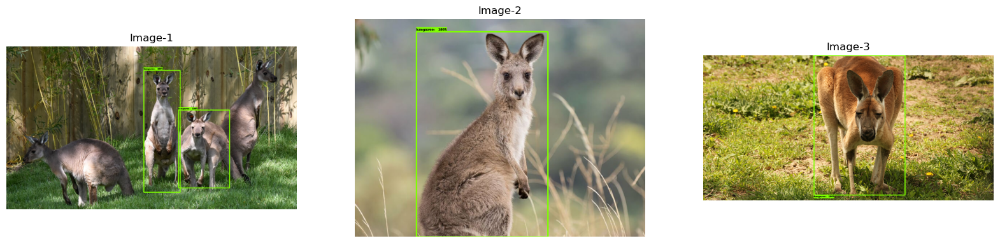

In [123]:
num_of_examples = 3

test_ds = tf.data.TFRecordDataset(
    './dataset/test.record').take(
        num_of_examples)
show_batch(test_ds, num_of_examples)

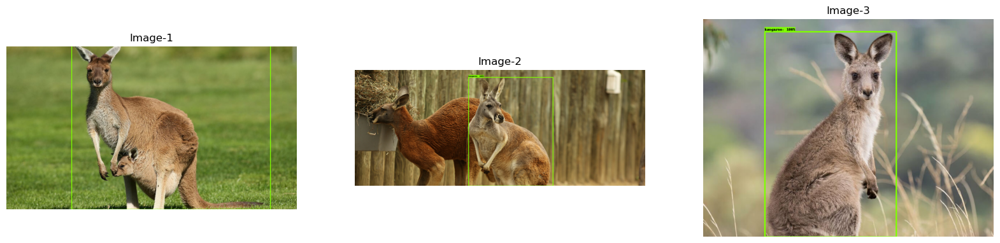

In [163]:
num_of_examples = 3

test_ds = tf.data.TFRecordDataset(
    './dataset/test.record').shuffle(
        buffer_size=buffer_size).take(num_of_examples)
show_batch(test_ds, num_of_examples)

### Importing Trained Tensorflow SavedModel

In [ ]:
# !unzip ./exported_model.zip

In [ ]:
# export_dir = "./exported_model"

In [124]:
imported = tf.saved_model.load(export_dir)
model_fn = imported.signatures['serving_default']

### Visualize predictions.

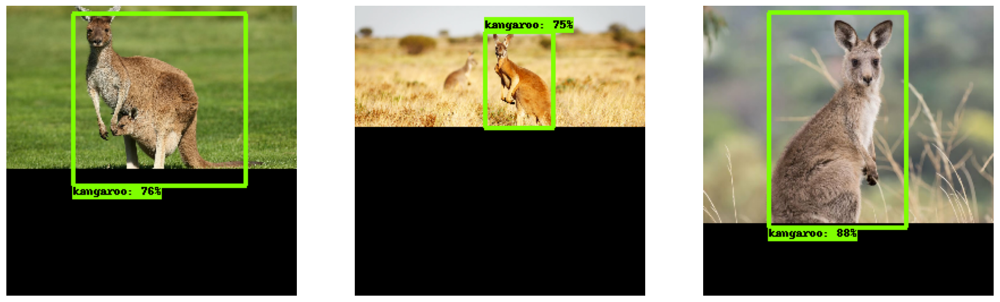

In [147]:
input_image_size = (HEIGHT, WIDTH)
plt.figure(figsize=(20, 20))
min_score_thresh = 0.70 # Change minimum score for threshold

for i, serialized_example in enumerate(test_ds):
  plt.subplot(1, 3, i+1)
  decoded_tensors = tf_ex_decoder.decode(serialized_example)
  image = build_inputs_for_object_detection(decoded_tensors['image'], input_image_size)
  image = tf.expand_dims(image, axis=0)
  image = tf.cast(image, dtype = tf.uint8)
  image_np = image[0].numpy()
  result = model_fn(image)
  visualization_utils.visualize_boxes_and_labels_on_image_array(
      image_np,
      result['detection_boxes'][0].numpy(),
      result['detection_classes'][0].numpy().astype(int),
      result['detection_scores'][0].numpy(),
      category_index=category_index,
      use_normalized_coordinates=False,
      max_boxes_to_draw=200, #200
      min_score_thresh=min_score_thresh,
      agnostic_mode=False,
      instance_masks=None,
      line_thickness=4)
  plt.imshow(image_np)
  plt.axis('off')

plt.show()

## Testing model on multiple images

In [130]:
import os

images_path = os.path.dirname("./images/")

print(images_path)

test_images = []
    
for file in os.listdir(images_path):
    filename = os.fsdecode(file)
    image_array = load_image_into_numpy_array(os.path.join(images_path, filename))
    test_images.append(image_array)

./images


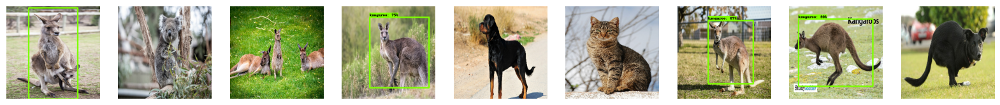

In [166]:
import os
import glob
import matplotlib.pyplot as plt
import tensorflow as tf
from object_detection.utils import visualization_utils
from PIL import Image

input_image_size = (HEIGHT, WIDTH)

folder_path = "./images"

# Get a list of image file paths in the folder
image_files = glob.glob(os.path.join(folder_path, '*.jpg')) + glob.glob(os.path.join(folder_path, '*.png'))

plt.figure(figsize=(20, 20))
min_score_thresh = 0.70  
for i, image_path in enumerate(image_files):
    plt.subplot(1, len(image_files), i + 1)

    # Load and preprocess the image using TensorFlow
    image = tf.io.read_file(image_path)
    image = tf.image.decode_image(image, channels=3)  # Assuming RGB images
    image = tf.image.resize(image, input_image_size)
    image = tf.expand_dims(image, axis=0)
    image = tf.cast(image, dtype=tf.uint8)
    image_np = image[0].numpy()

    # Run object detection on the image
    result = model_fn(image)

    # Visualize the bounding boxes on the image
    visualization_utils.visualize_boxes_and_labels_on_image_array(
        image_np,
        result['detection_boxes'][0].numpy(),
        result['detection_classes'][0].numpy().astype(int),
        result['detection_scores'][0].numpy(),
        category_index=category_index,
        use_normalized_coordinates=False,
        max_boxes_to_draw=200,  # 200
        min_score_thresh=min_score_thresh,
        agnostic_mode=False,
        instance_masks=None,
        line_thickness=4
    )

    plt.imshow(image_np)
    plt.axis('off')

plt.show()


## Sources

* Object detection with Model Garden, TensorFlow. https://www.tensorflow.org/tfmodels/vision/object_detection